In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_D1-1.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 12919 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 548 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

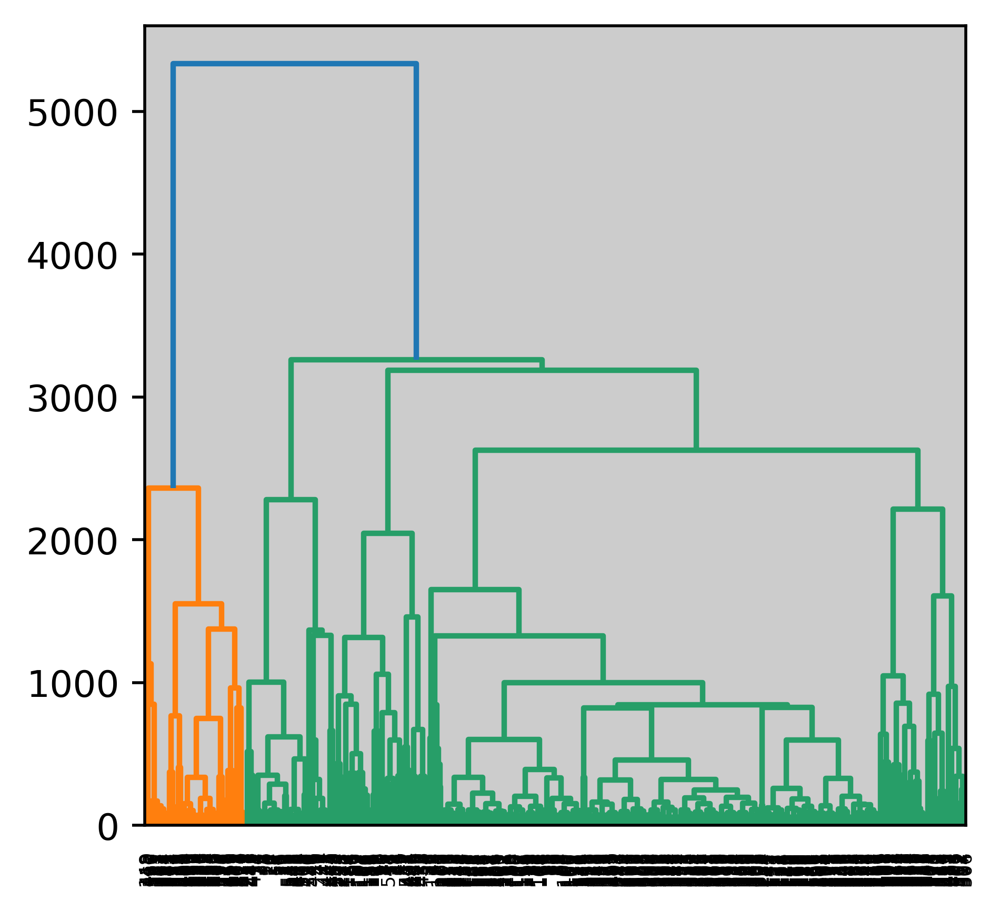

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 548 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=150, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[ 72  77 139  35  35  35  39  25  25  25  25 129  25  25  25  25  25  25
 101  25  25  25 121  25  25 141  74 131 103  91  86  74  74 123 116  88
 130 127   9  36  36  35 147  79   3  94   3 140  85  64  42 115 124  89
   9   9   9 104   0  36 148 133 132 102  57 113  69 128 117  92   1   1
 143   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1  51  98  14   1   1   1   1   1   1   1   1   1
   1  28   0  14   1   1   1   1   1   1   1   1  28  63   1   1   1   1
   1   1   1  28  28   1   1   1   1   1   1   1  28  28   1   1   1   1
   1   1   1   1  87   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1  78  65   1   1   1   1   1   1   1 135 125 126   1   1
   1   1   1   1  84   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1 149 119   1   1   1   1   1   1   1 138   1   1   1   1  99
  50   1   1   1   1   1   1 112   1   1   1   1   

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_2736309/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

1      287
11      24
25      15
6       11
17      10
      ... 
64       1
63       1
62       1
61       1
149      1
Name: SMC_clusters, Length: 150, dtype: int64

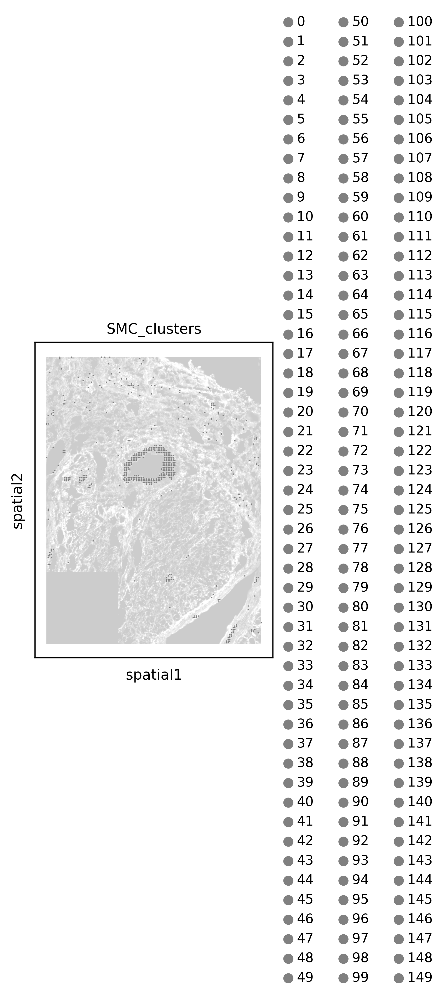

In [17]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

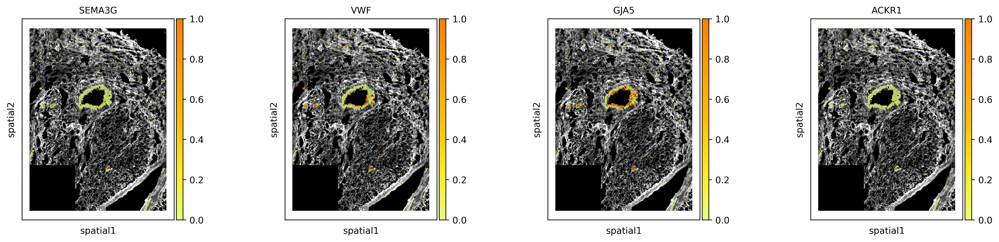

In [18]:
sc.pl.spatial(adata_aec,
              color=["SEMA3G","VWF","GJA5","ACKR1"],img_key='WGA',size=10, cmap = 'Wistia', vmax = 1)

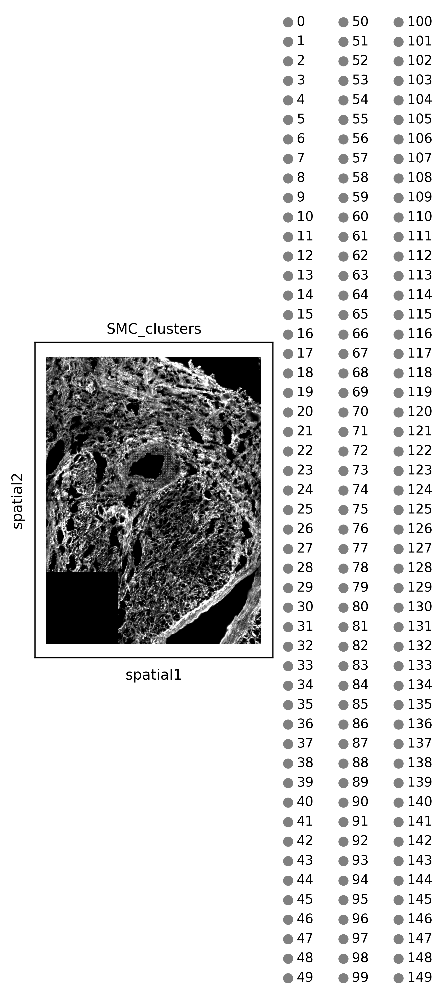

In [19]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=5, alpha_img = 1)

In [20]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[1, 11, 25, 6, 17, 5, 35, 23, 28]

In [21]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [22]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [23]:
adata_aec_subset

AnnData object with n_obs × n_vars = 372 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [24]:
#del adata_aec_subset.uns['SMC_clusters_colors']

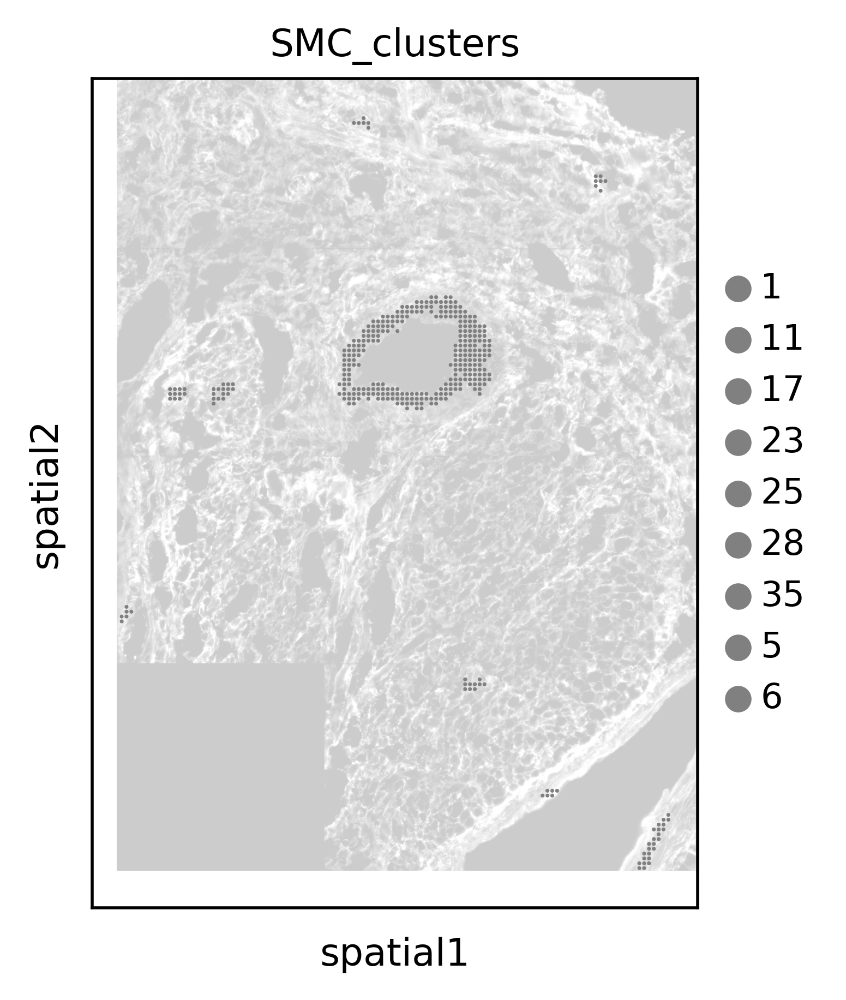

In [25]:
#99
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

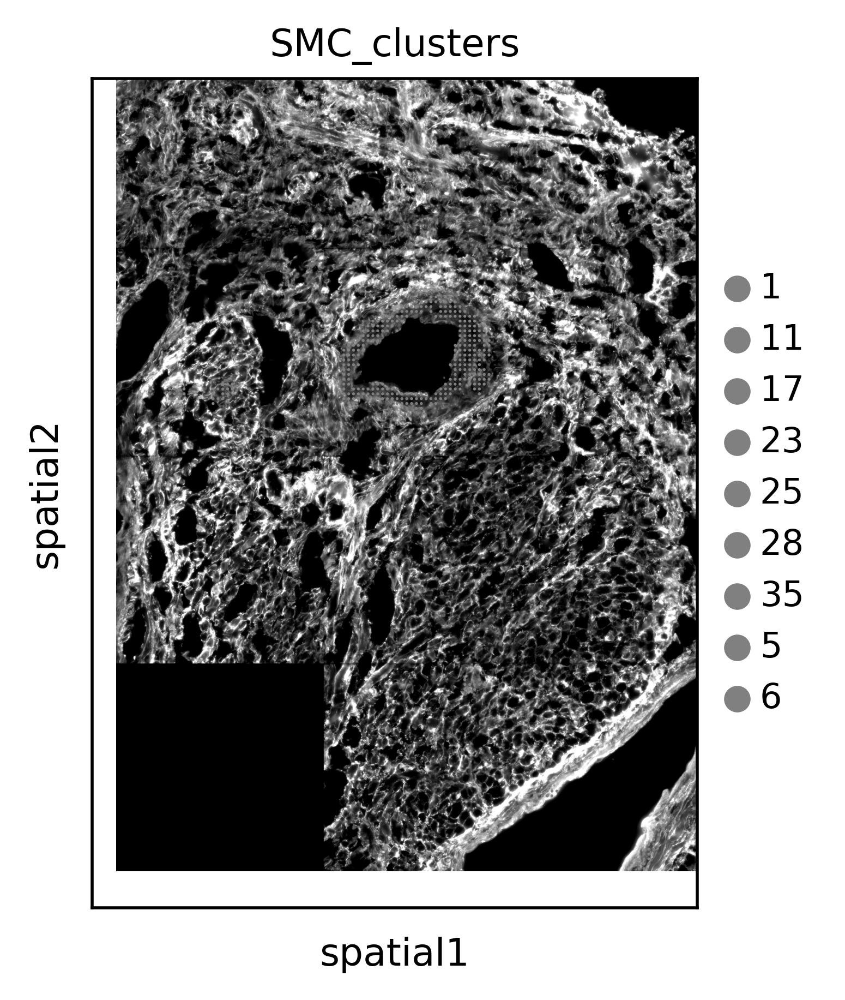

In [26]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

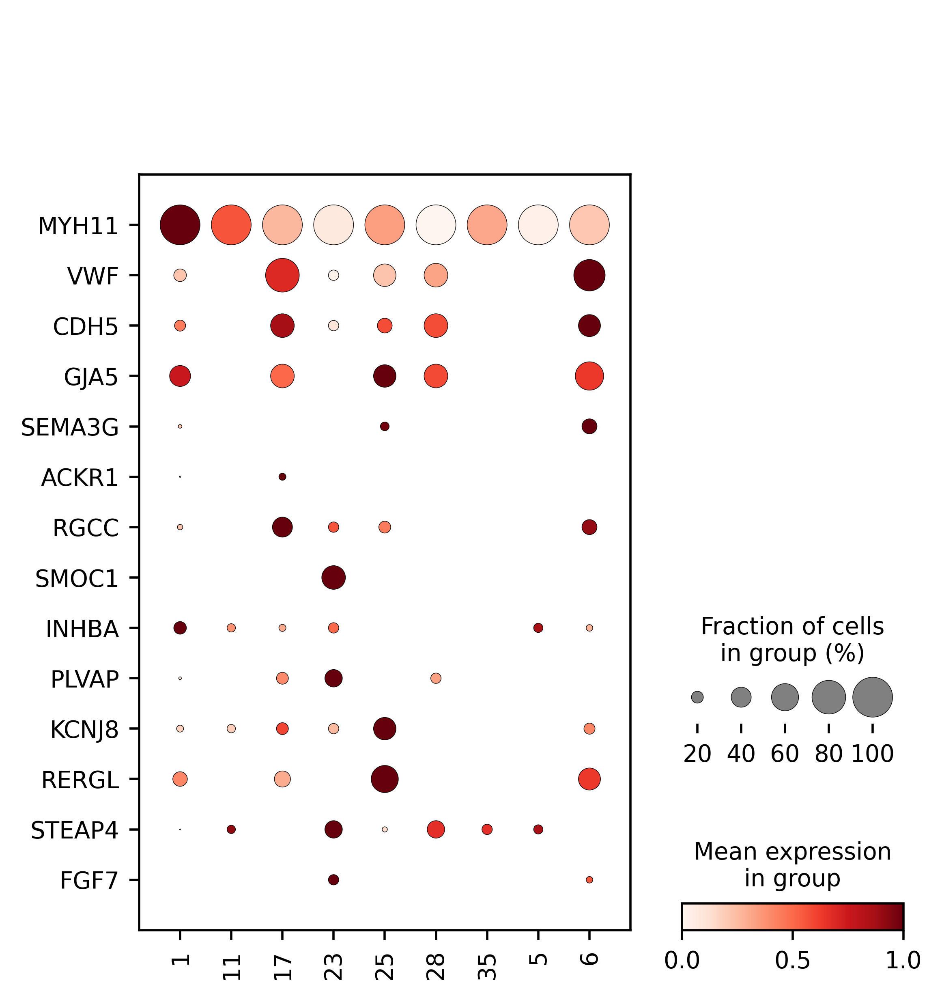

In [27]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [28]:
# add gene percentage expressed to dataframe

In [29]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [30]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [31]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [32]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [33]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [34]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [35]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [36]:
adata_aec_subset

AnnData object with n_obs × n_vars = 372 × 99
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [37]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [38]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000


In [39]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [40]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [41]:
matrix2 = matrix.replace(0, np.NaN)

In [42]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [43]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
1,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN
11,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN
17,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN
23,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0
25,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN
28,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN
35,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN
5,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
6,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN


### add expression values to dataframe

In [44]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [45]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN


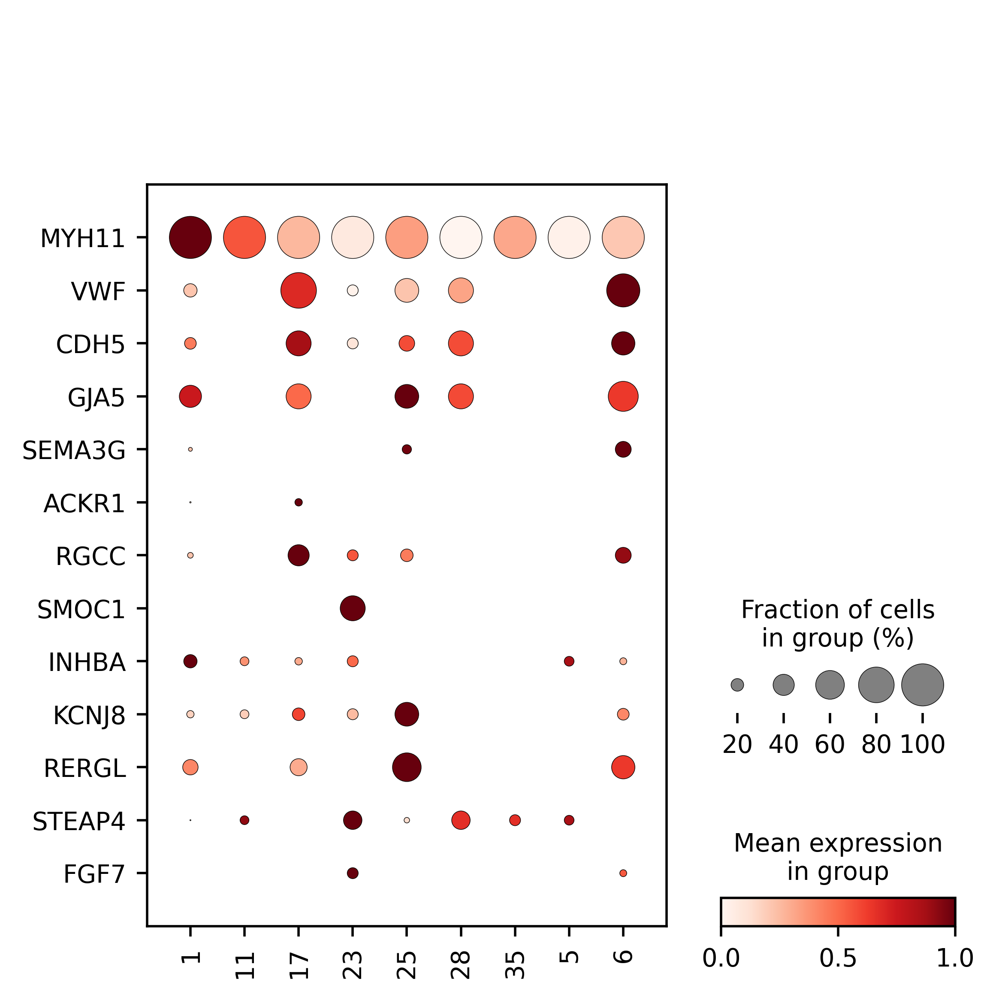

In [46]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [47]:
#add vessel type annotation column

In [48]:
test["Vessel"] = ['Artery','Endocardium','Endocardium','Artery','Endocardium','Artery','Unclear','Unclear','Artery']

In [67]:
del adata_aec_subset.uns['SMC_clusters_colors']

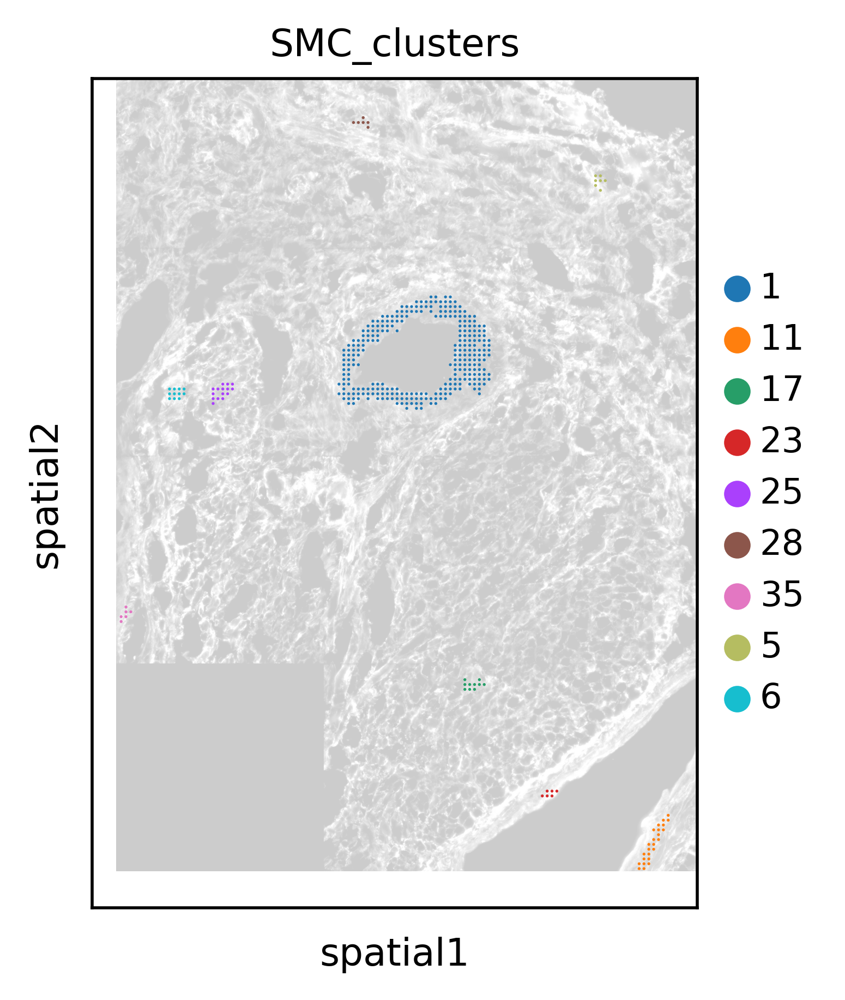

In [68]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2)

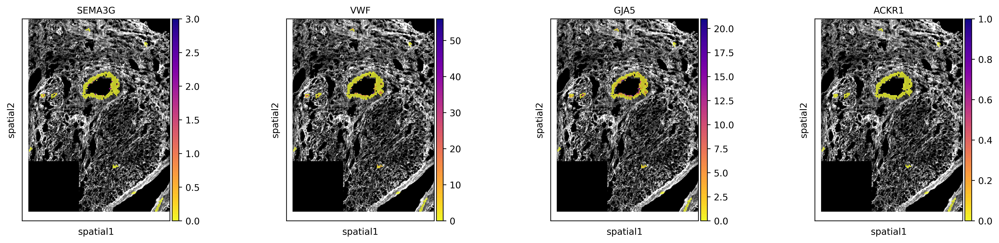

In [50]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5","ACKR1"],img_key='WGA',size=10, cmap = 'plasma_r')

In [51]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery


### add vessel size numbers

In [52]:
adata_aec_subset.obs.SMC_clusters.value_counts()

1     287
11     24
25     15
6      11
17     10
5       7
23      6
28      6
35      6
Name: SMC_clusters, dtype: int64

In [53]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [54]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [55]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery,287
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium,24
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium,10
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery,6
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium,15
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery,6
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear,6
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear,7
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery,11


In [56]:
group=pd.Series("Large", index=test2.index)

In [57]:
group[test2["size"] <= 30] = "Small"

In [58]:
group

SMC_clusters
1     Large
11    Small
17    Small
23    Small
25    Small
28    Small
35    Small
5     Small
6     Small
dtype: object

In [59]:
test2["group"] = group

In [60]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery,287,Large
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium,24,Small
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium,10,Small
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery,6,Small
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium,15,Small
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery,6,Small
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear,7,Small
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery,11,Small


In [61]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [62]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery,287,Large,Artery_Large
11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium,24,Small,Endocardium_Small
17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium,10,Small,Endocardium_Small
23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery,6,Small,Artery_Small
25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium,15,Small,Endocardium_Small
28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery,6,Small,Artery_Small
35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small
5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear,7,Small,Unclear_Small
6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery,11,Small,Artery_Small


In [63]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [64]:
test2.index = ['ROI_D1-1_' + str(i) for i in test2.index.tolist()]

In [65]:
test2["ROI"] = "D1-1"

In [66]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_D1-1_1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery,287,Large,Artery_Large,D1-1
ROI_D1-1_11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium,24,Small,Endocardium_Small,D1-1
ROI_D1-1_17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium,10,Small,Endocardium_Small,D1-1
ROI_D1-1_23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery,6,Small,Artery_Small,D1-1
ROI_D1-1_25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium,15,Small,Endocardium_Small,D1-1
ROI_D1-1_28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery,6,Small,Artery_Small,D1-1
ROI_D1-1_35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear,6,Small,Unclear_Small,D1-1
ROI_D1-1_5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear,7,Small,Unclear_Small,D1-1
ROI_D1-1_6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery,11,Small,Artery_Small,D1-1


[Text(0.5, 1.0, 'RERGL percentage expression')]

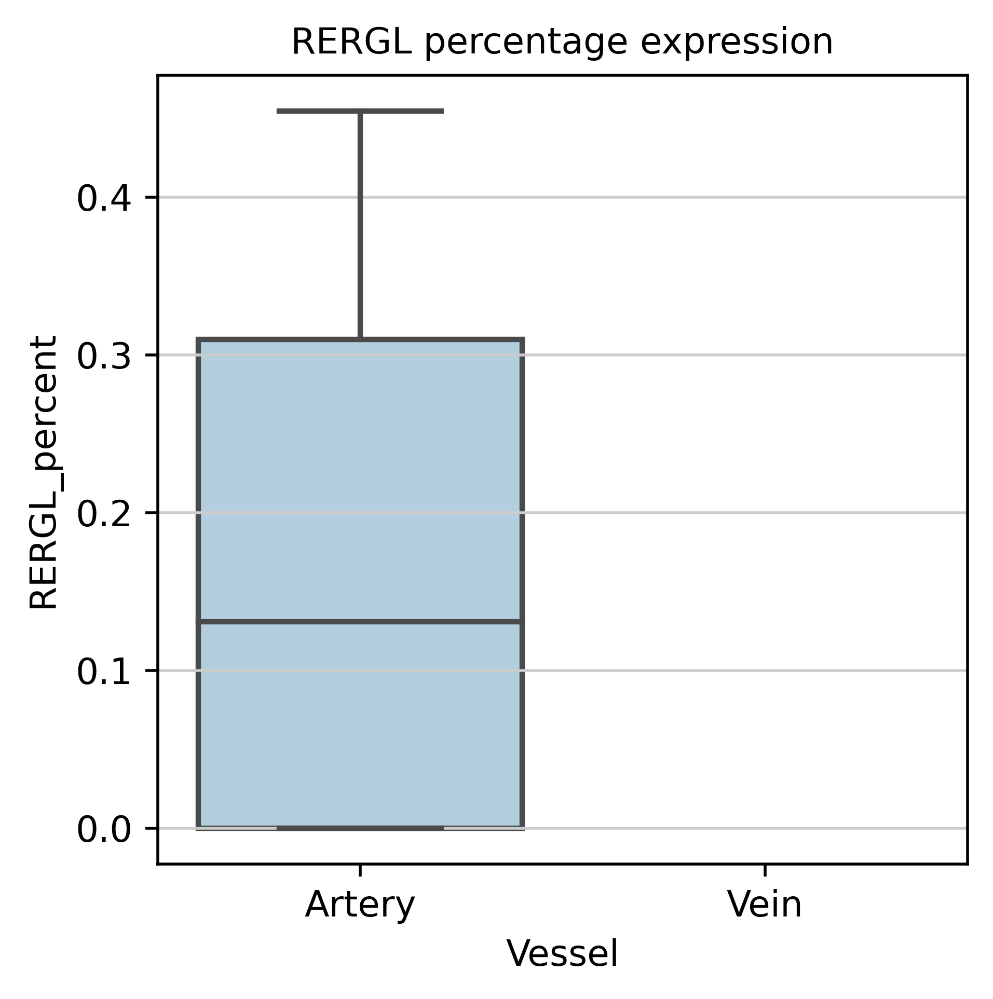

In [67]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

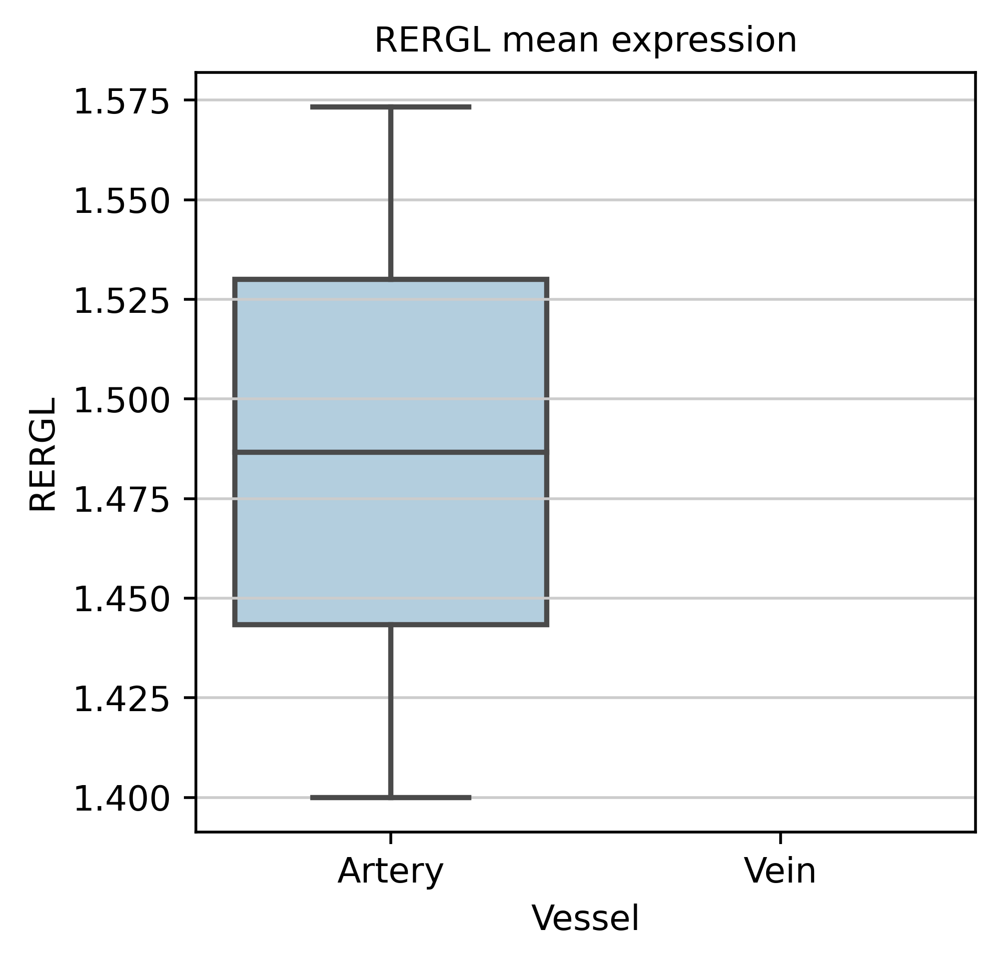

In [68]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

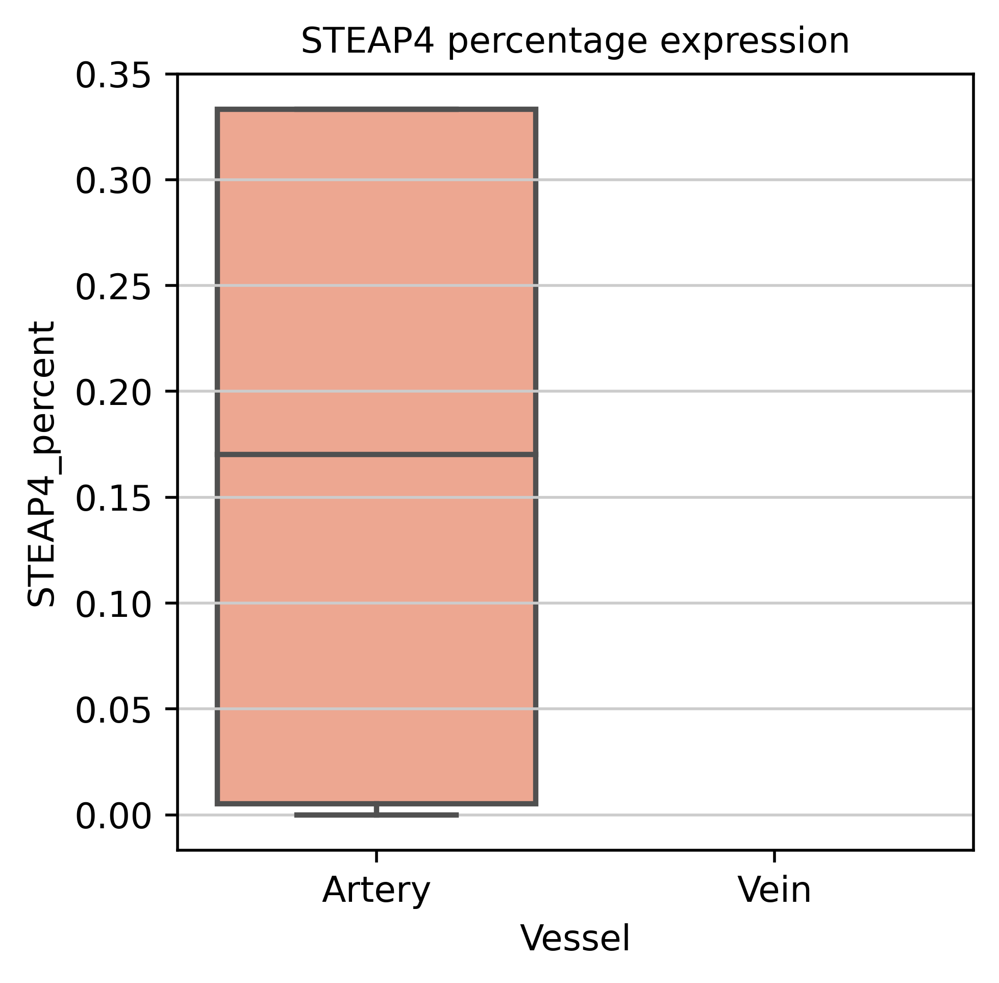

In [69]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

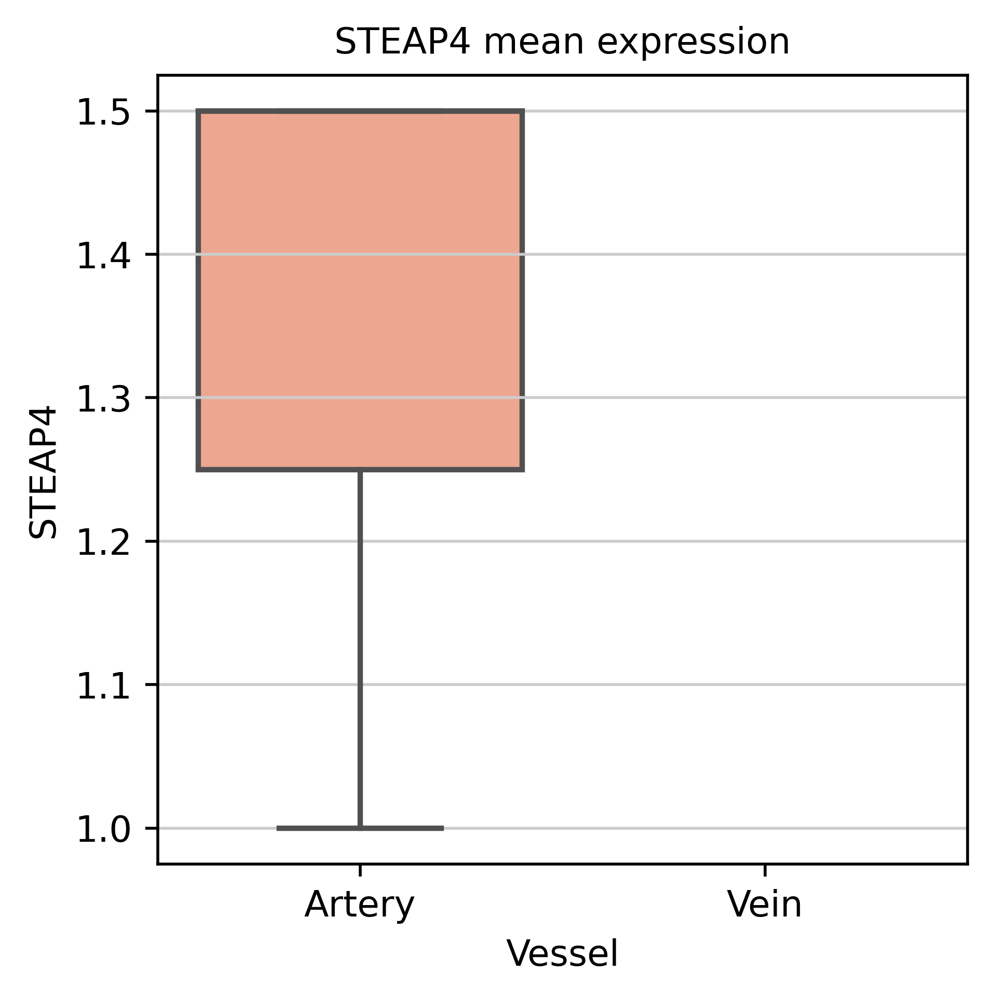

In [70]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

[Text(0.5, 1.0, 'KCNJ8 percentage expression')]

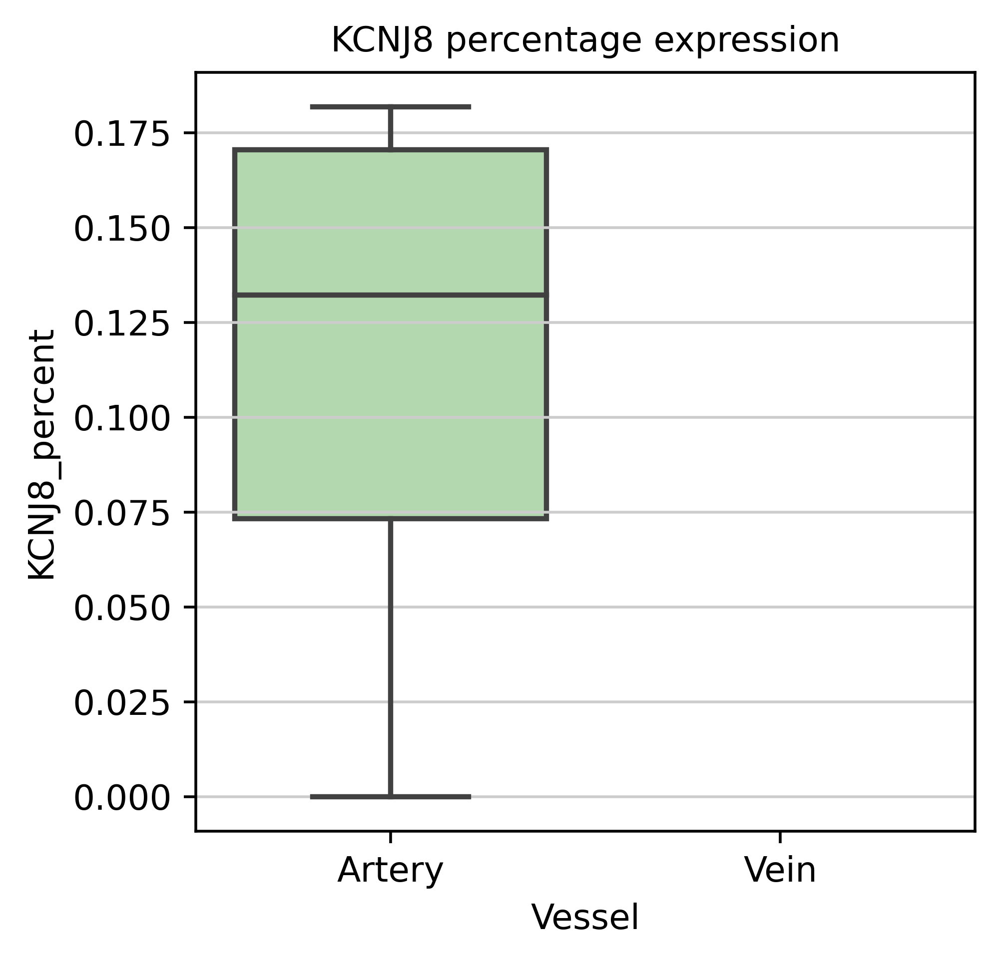

In [71]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8_percent", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 percentage expression')

[Text(0.5, 1.0, 'KCNJ8 mean expression')]

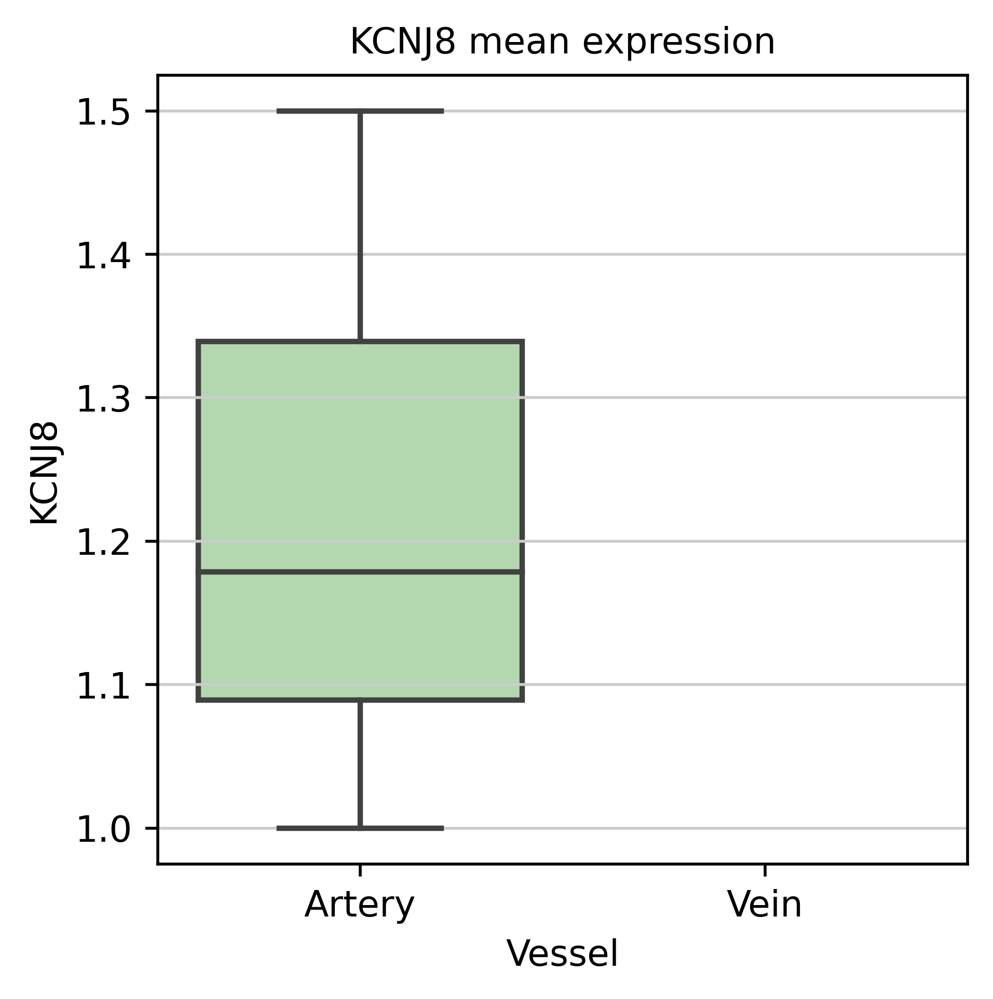

In [72]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 mean expression')

In [73]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_D2-1_1,0.261324,0.006969,0.000000,0.097561,0.515679,0.0,0.000000,1.573333,1.500000,NaN,4.000000,1.178571,1.416667,1.0,1.900000,NaN,Artery,D2-1
ROI_D2-1_11,0.000000,0.125000,0.000000,0.125000,0.041667,0.0,0.041667,NaN,3.666667,NaN,1.000000,1.000000,NaN,NaN,NaN,NaN,Endocardium,D2-1
ROI_D2-1_17,0.300000,0.000000,0.000000,0.200000,0.700000,0.0,0.000000,1.000000,NaN,NaN,4.428571,2.000000,NaN,1.0,1.500000,NaN,Endocardium,D2-1
ROI_D2-1_23,0.000000,0.333333,0.166667,0.166667,0.333333,0.0,0.000000,NaN,1.500000,1.0,3.000000,1.000000,NaN,NaN,2.000000,1.0,Artery,D2-1
ROI_D2-1_25,0.600000,0.066667,0.000000,0.466667,0.800000,0.0,0.000000,1.666667,1.000000,NaN,4.083333,1.428571,2.000000,NaN,1.333333,NaN,Endocardium,D2-1
ROI_D2-1_28,0.000000,0.333333,0.000000,0.000000,0.333333,0.0,0.000000,NaN,1.000000,NaN,4.000000,NaN,NaN,NaN,NaN,NaN,Artery,D2-1
ROI_D2-1_35,0.000000,0.166667,0.000000,0.000000,0.333333,0.0,0.000000,NaN,2.000000,NaN,2.000000,NaN,NaN,NaN,NaN,NaN,Unclear,D2-1
ROI_D2-1_5,0.000000,0.142857,0.000000,0.000000,0.142857,0.0,0.000000,NaN,3.000000,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,Unclear,D2-1
ROI_D2-1_6,0.454545,0.000000,0.090909,0.181818,0.727273,0.0,0.000000,1.400000,NaN,1.0,2.375000,1.500000,1.000000,NaN,2.000000,NaN,Artery,D2-1


[Text(0.5, 1.0, 'STEAP4/KCNJ8 percent expression')]

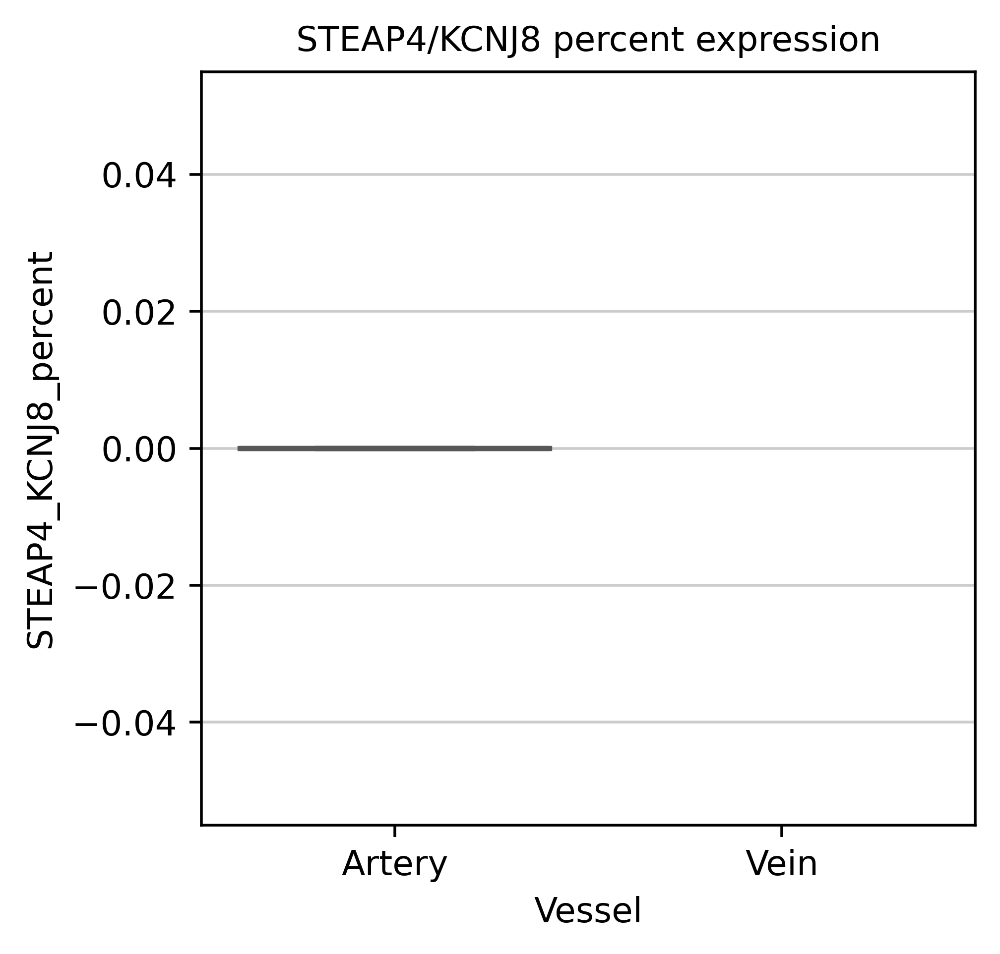

In [74]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_KCNJ8_percent", palette = 'Purples', order = ['Artery','Vein']).set(title='STEAP4/KCNJ8 percent expression')